# Corona Dashboard per Country over Time

This is a visualization of the corona pandemia over time in all countries that exist in the Johns Hopkins dataset.

In [10]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.dates as mdates

In [2]:
infected = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
recovered = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv')
deaths = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')

In [3]:
print('Last date Johns Hopkins Data: '+ infected.columns[-1])

Last date Johns Hopkins Data: 6/7/20


In [4]:
def process_dataframes(data):

    data_grouped = data.groupby(['Country/Region']).sum().drop(['Lat','Long'], axis=1).T.reset_index()
    data_grouped_province = data.groupby(['Province/State']).sum().drop(['Lat','Long'], axis=1).T.reset_index()
    
    data_grouped['all'] = data_grouped.sum(axis=1)

    data_grouped['index'] = pd.to_datetime(data_grouped['index'])
    data_grouped = data_grouped.set_index('index')

    data_grouped_province['index'] = pd.to_datetime(data_grouped_province['index'])
    data_grouped_province = data_grouped_province.set_index('index')
    
    return (data_grouped, data_grouped_province)

In [5]:
def segment_countries_provinces(data_grouped,data_grouped_province, list_of_tuples =[['all','China'],['all','US'],['all','Brazil'],['China','Hubei']]):
    for large,small in list_of_tuples:
        name = large +' w/o '+ small
        if small in data_grouped_province:
            data_grouped[name]=data_grouped[large]-data_grouped_province[small]
            data_grouped[small] = data_grouped_province[small]
        else:
            data_grouped[name]=data_grouped[large]-data_grouped[small]

In [6]:
infected_grouped, infected_grouped_province = process_dataframes(infected)
recovered_grouped, recovered_grouped_province = process_dataframes(recovered)
deaths_grouped, deaths_grouped_province = process_dataframes(deaths)
removed_grouped, removed_grouped_province = deaths_grouped+recovered_grouped, deaths_grouped_province+recovered_grouped_province
active_grouped, active_grouped_province = infected_grouped-deaths_grouped-recovered_grouped, infected_grouped_province-deaths_grouped_province-recovered_grouped_province

In [7]:
segment_countries_provinces(infected_grouped,infected_grouped_province)
segment_countries_provinces(recovered_grouped,recovered_grouped_province)
segment_countries_provinces(deaths_grouped, deaths_grouped_province)
segment_countries_provinces(active_grouped, active_grouped_province)

In [8]:
def plot_corona(country = 'Germany', data_grouped=infected_grouped, data_recovered=recovered_grouped, data_deaths=deaths_grouped):
    #fig, ax = plt.subplots(figsize=(20, 5))


    
    fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(20, 5))
    
    ax1.set_title('Cases')
    ax2.set_title('New Cases')
    ax3.set_title('Infectivity')
    
    plt.suptitle(country, fontsize=20)

    data_grouped[country].diff().plot(label='Infected', ax=ax2)
 
    
    x=data_grouped.index
    y = []
    labels=[]
    colors = []
    removed = pd.Series(index=x).fillna(0)

    
    if data_recovered[country] is not None:
        
        y.append(data_recovered[country].fillna(0))
        removed = removed + data_recovered[country]
        labels.append('Recovered')
        colors.append('g')
    
    
    if data_grouped[country] is not None:
        y.append(data_grouped[country]-removed)
        labels.append('Infected')
        colors.append('r')
        
    if data_deaths[country] is not None:
        
        y.append(data_deaths[country].fillna(0))
        removed = np.add(removed, data_deaths[country])
        labels.append('Deceased')
        colors.append('k')
        #print(removed.columns)
        
  
    
    
    y=list(reversed(y))
    colors=list(reversed(colors))
    labels=list(reversed(labels))
    ax1.stackplot(x,y, labels=labels, colors=colors)

    
    
    
    infectivity_rate=(data_grouped[country].diff().rolling(7).mean().pct_change()+1)
    infectivity_rate.plot(label='Infectivity 7d avg',ax=ax3)
    
    # Calculate the rolling mean of all death by all cases and then multiply by 10 so it fits
    # on the same scale
    fatality_rate = np.divide(data_deaths[country],data_grouped[country]).fillna(0).rolling(7).mean()*10
    fatality_rate.plot(label='Fatality Rate *10 7d avg',ax=ax3, color='r')
    
    # Lines for new cases constant/ doubling every 5 days, doubling every 3 days
    ax3.hlines(1, min(data_grouped.index), max(data_grouped.index), colors='k', linestyles='solid')
    ax3.hlines(2**(1/3), min(data_grouped.index), max(data_grouped.index), colors='k', linestyles='dashed')
    ax3.hlines(2**(1/5), min(data_grouped.index), max(data_grouped.index), colors='k', linestyles='dotted')
    
    
    # Some formatting
    locator = mdates.AutoDateLocator()
    formatter = mdates.ConciseDateFormatter(locator)
    ax1.xaxis.set_major_formatter(formatter)

    
    #ax1.xaxis.set_ticks(x[::20])
    #ax1.xaxis.set_major_formatter(mdates.DateFormatter("%b %Y"))  
    ax1.legend(loc='upper left')
    ax3.legend(loc='upper right')
    ax3.set_ylim([0,2.5])
    
  
    plt.legend()
    plt.show()

In each graphic we see:

- the leftmost plot that stacks deceased, recovered and currently infected cases
- the middle plot that simply shows the new infections over time
- the rightmost plot showing
    - the relation of new cases for day n in comparison to day n-1 as an average over 7 days (Infectivity)
    - horizontal lines at 1.0 and the doubling rates for 3 (dashed) and 5 (dotted) days
    - the fatality rate of all cases up until now times 10 (for ease of comparison) as an average over 7 days
    

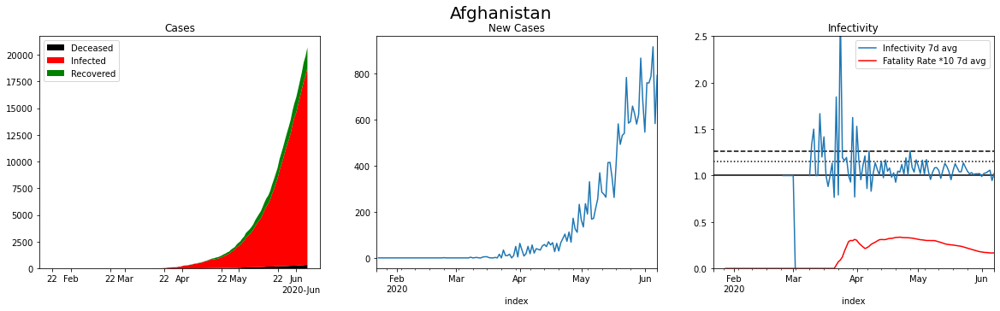

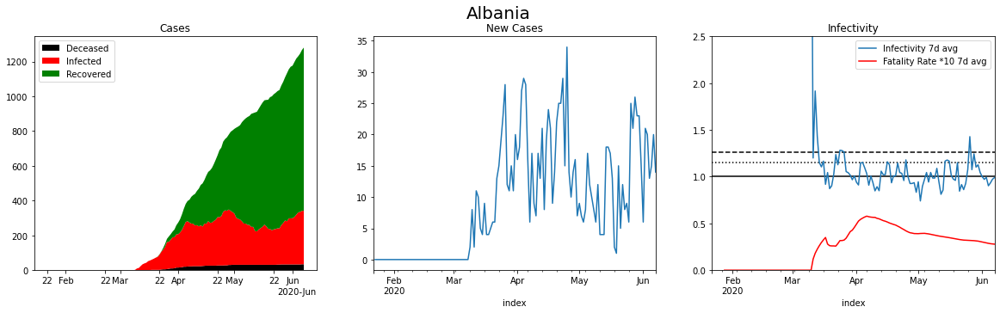

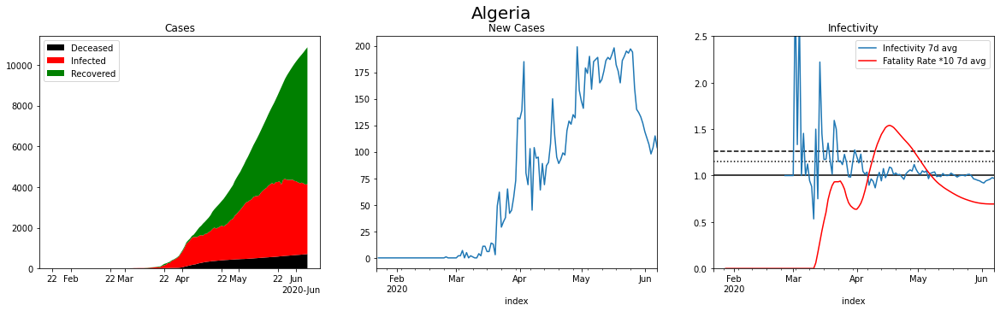

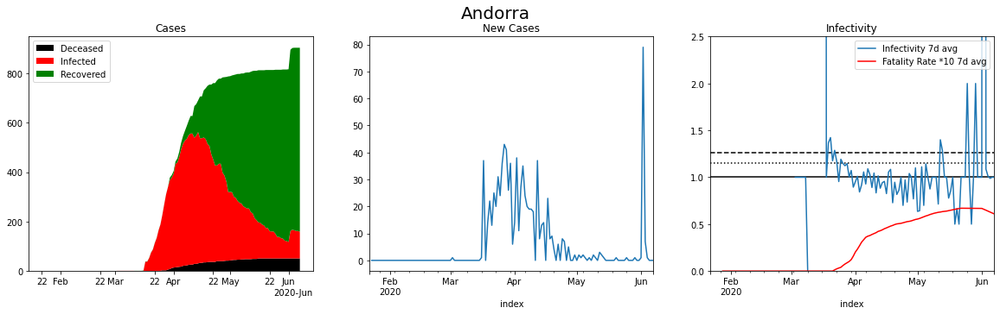

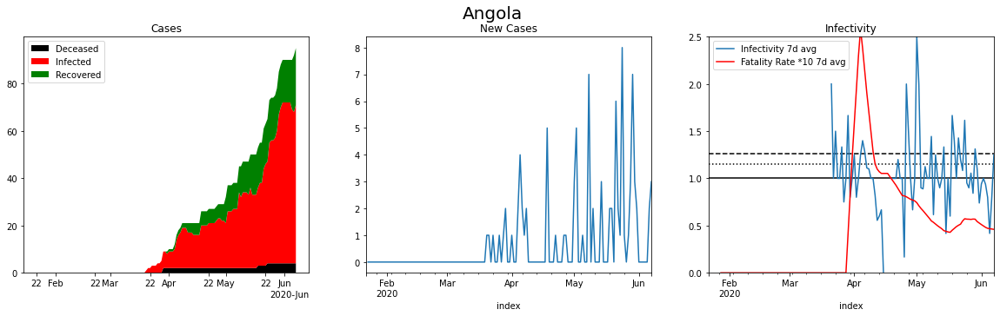

...

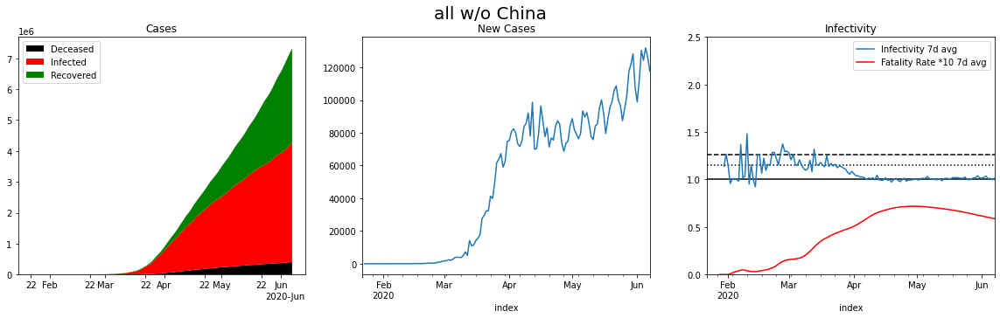

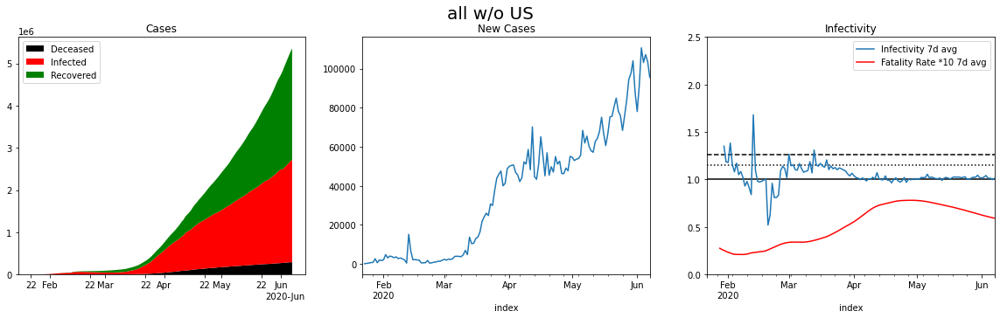

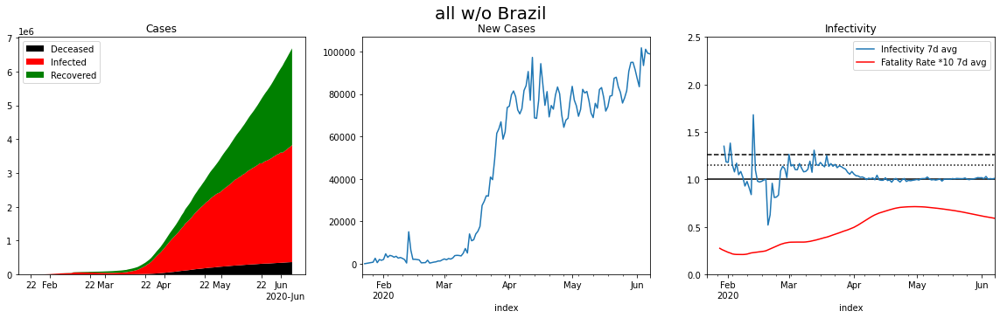

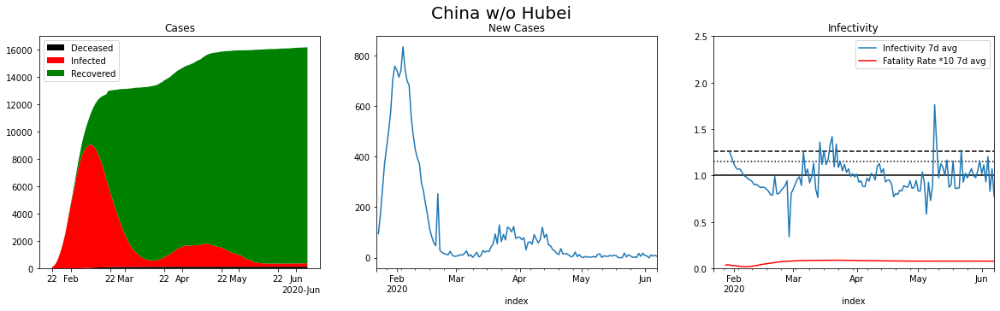

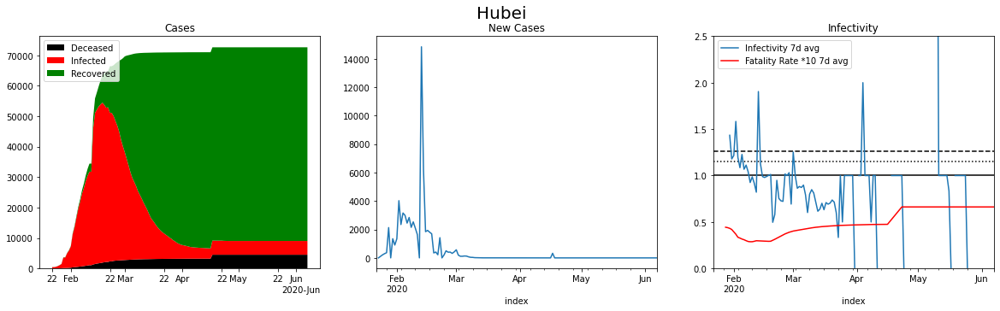

In [9]:
for country in infected_grouped.columns:
    try:
        plot_corona(country)
    except Exception as e:
        print(f"{country} did not work because {e}")
        pass